In [1]:
#Warning ignorance if generated

import warnings
warnings.filterwarnings("ignore")


In [2]:

#import necessary python packages for single-cell RNA SEQ analysis

import scanpy as sc #software suite of tools for single-cell analysis in python
import besca as bc #internal BEDA package for single cell analysis
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scipy
import anndata as ad
from scipy.sparse import csr_matrix
import scanpy.external as sce
from harmony import harmonize
import umap.umap_ as umap
print(ad.__version__)

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)

# gives error!! sc.logging.print_versions()

INFO:torch.distributed.nn.jit.instantiator:Created a temporary directory at /tmp/tmpgi4ei2hu
INFO:torch.distributed.nn.jit.instantiator:Writing /tmp/tmpgi4ei2hu/_remote_module_non_scriptable.py
INFO:lightning_fabric.utilities.seed:Global seed set to 0


0.9.1


In [3]:
#particularly displaying result settings for single cell analysis

sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.3 anndata==0.9.1 umap==0.3.10 numpy==1.23.5 scipy==1.10.1 pandas==2.0.1 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.10


/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/_settings.py:447: DeprecationWarning:

`set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`



In [4]:
#loading all PBMC datasets into the workspace

#Load Disease PBMC dataset1 for sarcoidosis  
PBMCsarc1=sc.read_10x_mtx('/raid02/Data-live/tjana/LIB5455299_SAM24412250/outs/filtered_feature_bc_matrix/', 
                      var_names='gene_symbols',cache=True)

#Load Disease PBMC dataset2 for sarcoidosis  
PBMCsarc2=sc.read_10x_mtx('/raid02/Data-live/tjana/LIB5455301_SAM24412252/outs/filtered_feature_bc_matrix/', 
                      var_names='gene_symbols',cache=True)

#Load Disease PBMC dataset1 for sarcoidosis  
PBMCsarc3=sc.read_10x_mtx('/raid02/Data-live/tjana/LIB5455303_SAM24412254/outs/filtered_feature_bc_matrix/', 
                      var_names='gene_symbols',cache=True)

#load Healthy PBMC Control1
PBMChealthy1=sc.read_10x_mtx('/raid02/Data-live/tjana/multi/SC3_v3_NextGem_DI_CellPlex_Human_PBMC_10K_h1/outs/per_sample_outs/PBMCs_human_2/count/sample_filtered_feature_bc_matrix/', 
                         var_names='gene_symbols',cache=True)

#load Healthy PBMC Control2
PBMChealthy2=sc.read_10x_mtx('/raid02/Data-live/tjana/5k_pbmc_v3_nextgem_fastqs_h2/outs/filtered_feature_bc_matrix/', 
                         var_names='gene_symbols',cache=True)

#load Healthy PBMC Control3
PBMChealthy3=sc.read_10x_mtx('/raid02/Data-live/tjana/3p_Citrate_CPT_fastqs_h3/outs/filtered_feature_bc_matrix/', 
                         var_names='gene_symbols',cache=True)

#load Healthy PBMC Control4
PBMChealthy4=sc.read_10x_mtx('/raid02/Data-live/tjana/10k_PBMC_3p_nextgem_Chromium_X_fastqs_h4/outs/filtered_feature_bc_matrix/', 
                         var_names='gene_symbols',cache=True)




... reading from cache file cache/raid02-Data-live-tjana-LIB5455299_SAM24412250-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/raid02-Data-live-tjana-LIB5455301_SAM24412252-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/raid02-Data-live-tjana-LIB5455303_SAM24412254-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/raid02-Data-live-tjana-multi-SC3_v3_NextGem_DI_CellPlex_Human_PBMC_10K_h1-outs-per_sample_outs-PBMCs_human_2-count-sample_filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/raid02-Data-live-tjana-5k_pbmc_v3_nextgem_fastqs_h2-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/raid02-Data-live-tjana-3p_Citrate_CPT_fastqs_h3-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/raid02-Data-live-tjana-10k_PBMC_3p_nextgem_Chromium_X_fastqs_h4-outs-filtered_feature_bc_matrix-matrix.h5ad


In [5]:
#Making all indexes into unique of all samples (Disease SARCOIDOSIS and Healthy)

#Sarcoidosis disease

PBMCsarc1.var_names_make_unique()
PBMCsarc2.var_names_make_unique()
PBMCsarc3.var_names_make_unique()

#Healthy/control

PBMChealthy1.var_names_make_unique()
PBMChealthy2.var_names_make_unique()
PBMChealthy3.var_names_make_unique()
PBMChealthy4.var_names_make_unique()

In [6]:
# Adding some metadata for all PBMC samples

PBMCsarc1.obs['type']="Sarcoidosis"
PBMCsarc1.obs['sample']="PBMC-Sarc-1"
PBMCsarc2.obs['type']="Sarcoidosis"
PBMCsarc2.obs['sample']="PBMC-Sarc-2"
PBMCsarc3.obs['type']="Sarcoidosis"
PBMCsarc3.obs['sample']="PBMC-Sarc-3"


PBMChealthy1.obs['type']="Healthy"
PBMChealthy1.obs['sample']="PBMC-healthy-1"
PBMChealthy2.obs['type']="Healthy"
PBMChealthy2.obs['sample']="PBMC-healthy-2"
PBMChealthy3.obs['type']="Healthy"
PBMChealthy3.obs['sample']="PBMC-healthy-3"
PBMChealthy4.obs['type']="Healthy"
PBMChealthy4.obs['sample']="PBMC-healthy-4"

# All samples are merged into one object named adata (anndata - Annotated data)

adata = PBMCsarc1.concatenate(PBMCsarc2, PBMCsarc3, PBMChealthy1, PBMChealthy2, PBMChealthy3, PBMChealthy4)

# Deleting individual datasets to save space

del(PBMCsarc1, PBMCsarc2, PBMCsarc3)
del(PBMChealthy1, PBMChealthy2, PBMChealthy3, PBMChealthy4)

/home/jana/my-notebook-venv/lib/python3.8/site-packages/anndata/_core/anndata.py:1755: FutureWarning:

The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html



In [7]:
# Displaying merged object observation and variables types

print (adata)
print ("------")

#Displaying counts cells sample wise

print(adata.obs['sample'].value_counts())

#Displaying counts total cells counts of healthy and Sarcoid (Sarc)
print ("------")
print(adata.obs['type'].value_counts())

AnnData object with n_obs × n_vars = 53455 × 36601
    obs: 'type', 'sample', 'batch'
    var: 'gene_ids', 'feature_types'
------
sample
PBMC-healthy-4    11999
PBMC-Sarc-2       10029
PBMC-Sarc-3        8754
PBMC-Sarc-1        7438
PBMC-healthy-1     6093
PBMC-healthy-2     5184
PBMC-healthy-3     3958
Name: count, dtype: int64
------
type
Healthy        27234
Sarcoidosis    26221
Name: count, dtype: int64


In [8]:
# Print merged adata var (variable) types
print (adata.var)

                    gene_ids    feature_types
MIR1302-2HG  ENSG00000243485  Gene Expression
FAM138A      ENSG00000237613  Gene Expression
OR4F5        ENSG00000186092  Gene Expression
AL627309.1   ENSG00000238009  Gene Expression
AL627309.3   ENSG00000239945  Gene Expression
...                      ...              ...
AC141272.1   ENSG00000277836  Gene Expression
AC023491.2   ENSG00000278633  Gene Expression
AC007325.1   ENSG00000276017  Gene Expression
AC007325.4   ENSG00000278817  Gene Expression
AC007325.2   ENSG00000277196  Gene Expression

[36601 rows x 2 columns]


In [9]:
# Print merged adata obs observation types
print (adata.obs)

                             type          sample batch
AAACCCAAGACATAAC-1-0  Sarcoidosis     PBMC-Sarc-1     0
AAACCCAAGAGGCGGA-1-0  Sarcoidosis     PBMC-Sarc-1     0
AAACCCAAGCGTACAG-1-0  Sarcoidosis     PBMC-Sarc-1     0
AAACCCAAGGTACAAT-1-0  Sarcoidosis     PBMC-Sarc-1     0
AAACCCACAGCGTACC-1-0  Sarcoidosis     PBMC-Sarc-1     0
...                           ...             ...   ...
TTTGTTGGTTGGATCT-1-6      Healthy  PBMC-healthy-4     6
TTTGTTGGTTTCTTAC-1-6      Healthy  PBMC-healthy-4     6
TTTGTTGTCCATTTCA-1-6      Healthy  PBMC-healthy-4     6
TTTGTTGTCTACACAG-1-6      Healthy  PBMC-healthy-4     6
TTTGTTGTCTCATTAC-1-6      Healthy  PBMC-healthy-4     6

[53455 rows x 3 columns]


In [10]:
# Identification of mitochondrial genes by giving a pattern 'MT-'
adata.var['mt'] = adata.var_names.str.startswith('MT-') 

#  Identification ribosomal genes by giving a pattern 'RPS/RPL'
adata.var['ribo'] = adata.var_names.str.startswith(("RPS","RPL"))

#  Identification hemoglobin genes by giving a pattern ^HB[^(P)]

adata.var['hb'] = adata.var_names.str.contains(("^HB[^(P)]"))

# Print merged adata varibale
print ("adata variables types including genes_id, feature types, mt, ribo and hb")

print("----------------")
print (adata.var)

adata variables types including genes_id, feature types, mt, ribo and hb
----------------
                    gene_ids    feature_types     mt   ribo     hb
MIR1302-2HG  ENSG00000243485  Gene Expression  False  False  False
FAM138A      ENSG00000237613  Gene Expression  False  False  False
OR4F5        ENSG00000186092  Gene Expression  False  False  False
AL627309.1   ENSG00000238009  Gene Expression  False  False  False
AL627309.3   ENSG00000239945  Gene Expression  False  False  False
...                      ...              ...    ...    ...    ...
AC141272.1   ENSG00000277836  Gene Expression  False  False  False
AC023491.2   ENSG00000278633  Gene Expression  False  False  False
AC007325.1   ENSG00000276017  Gene Expression  False  False  False
AC007325.4   ENSG00000278817  Gene Expression  False  False  False
AC007325.2   ENSG00000277196  Gene Expression  False  False  False

[36601 rows x 5 columns]


In [11]:
#Calculating the QC metrices of merged object adata
print ("....PRE QC metrices....calculating")

sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo','hb'], percent_top=None, log1p=False, inplace=True)

print ("......PRE QC metrices....calculating done")


....PRE QC metrices....calculating
......PRE QC metrices....calculating done


In [12]:
#Now you can see that we have additional data in the scanpy obs slot.
print("Computing cell compute fraction of counts in mito genes vs. all genes")
mito_genes = adata.var_names.str.startswith('MT-')

# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mt2'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1

# Adding the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1
print ("computing done")

Computing cell compute fraction of counts in mito genes vs. all genes
computing done


... storing 'type' as categorical
... storing 'sample' as categorical
... storing 'feature_types' as categorical


Plot of Pre QC metrices


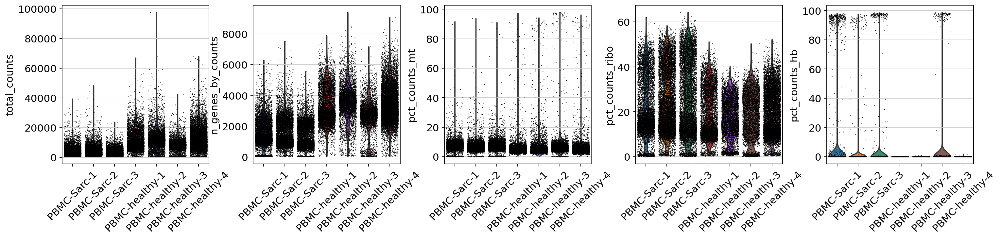

In [13]:
#Violin plot of whole QC metrices of merged object in samples wise 
print ("Plot of Pre QC metrices")
sc.pl.violin(adata, ['total_counts', 'n_genes_by_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'sample', rotation= 45, multi_panel=True)

Scatter plots


/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:490: MatplotlibDeprecationWarning:

The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.



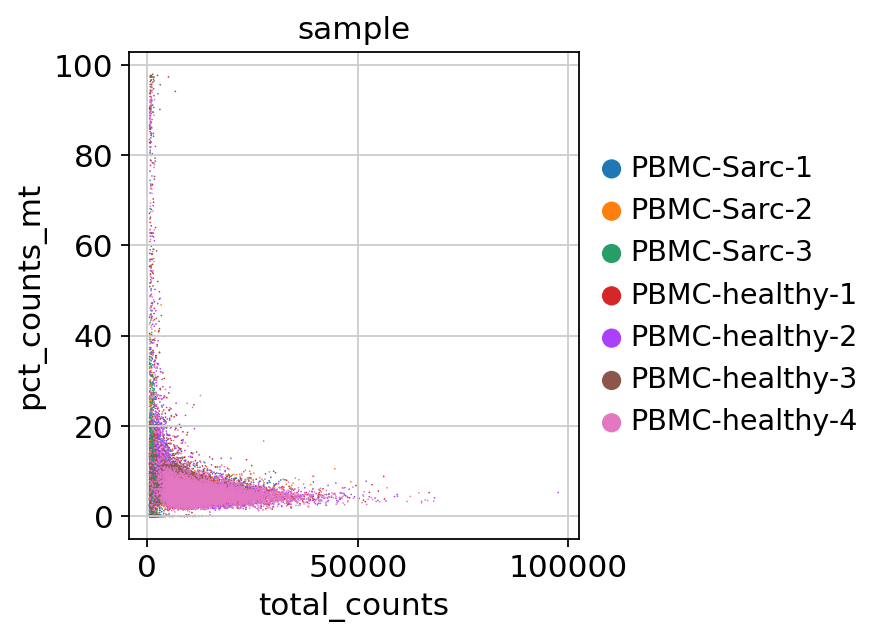

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:490: MatplotlibDeprecationWarning:

The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.



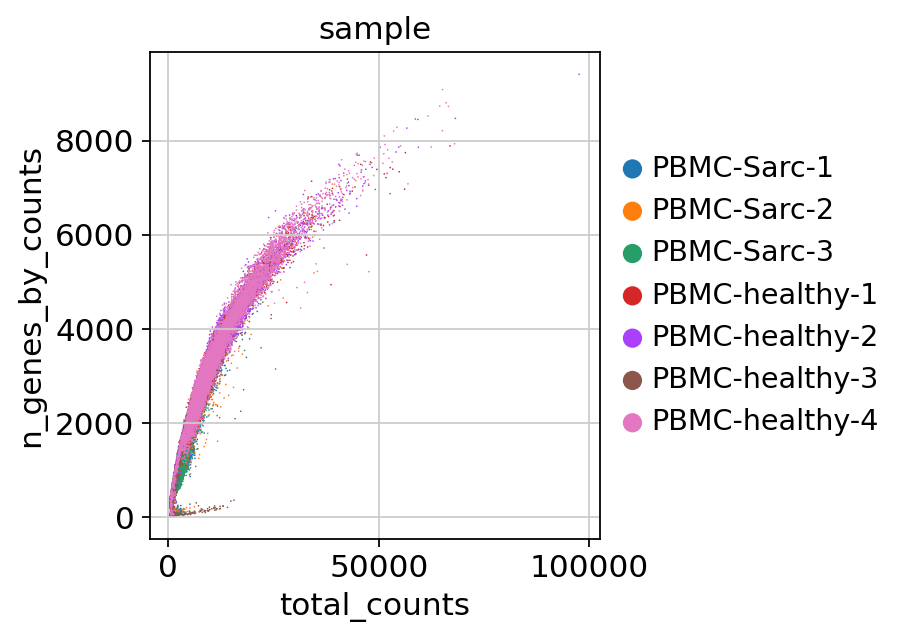

In [14]:
#Scatter plot: (total counts vs. pct_counts_mt) & (total counts vs  n_genes_by_counts):  sample wise
print ("Scatter plots")
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="sample")
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="sample")

In [15]:
#  Basic Filtering with minimum number of  cells and genes

sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

# Displaying Number of observations and Number of variables/features
print  ("adata contains observations and variables")

print(adata.n_obs, adata.n_vars)

filtered out 891 cells that have less than 200 genes expressed
filtered out 6735 genes that are detected in less than 3 cells
adata contains observations and variables
52564 29866


In [16]:
# Fixing cutoff for n_genes_by_counts, mt and ribo for percent mito

print ("Fixing cutoff for n_genes_by_counts, mt and ribo for post processing")

# filter for total_counts than 8000
adata = adata[adata.obs.total_counts < 60000, :]

# filter for n_genes_by_counts than 8000
adata = adata[adata.obs.n_genes_by_counts < 8000, :]

# filter for pct_counts_mt than 15
adata = adata[adata.obs['pct_counts_mt'] < 15, :]

# filter for percent ribo less than 50

adata = adata[adata.obs['pct_counts_ribo'] < 60 , :]


print("Remaining cells %d"%adata.n_obs)

print("Remaining features/genes %d"%adata.n_vars)

Fixing cutoff for n_genes_by_counts, mt and ribo for post processing
Remaining cells 51429
Remaining features/genes 29866


final QC cutoffs for post processing


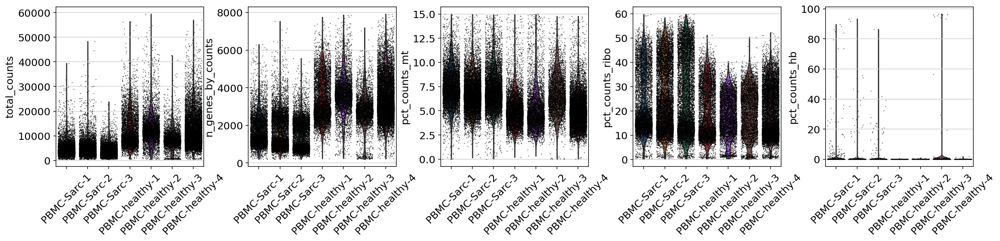

In [17]:
#After fitering mito and ribo part, the Violin plot of whole QC metrices of merged object in samples wise
print ("final QC cutoffs for post processing")

sc.pl.violin(adata, ['total_counts', 'n_genes_by_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'sample', rotation = 45)

Highest expressed genes post QC cutoff chosen


/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning:

Received a view of an AnnData. Making a copy.



normalizing counts per cell
    finished (0:00:01)


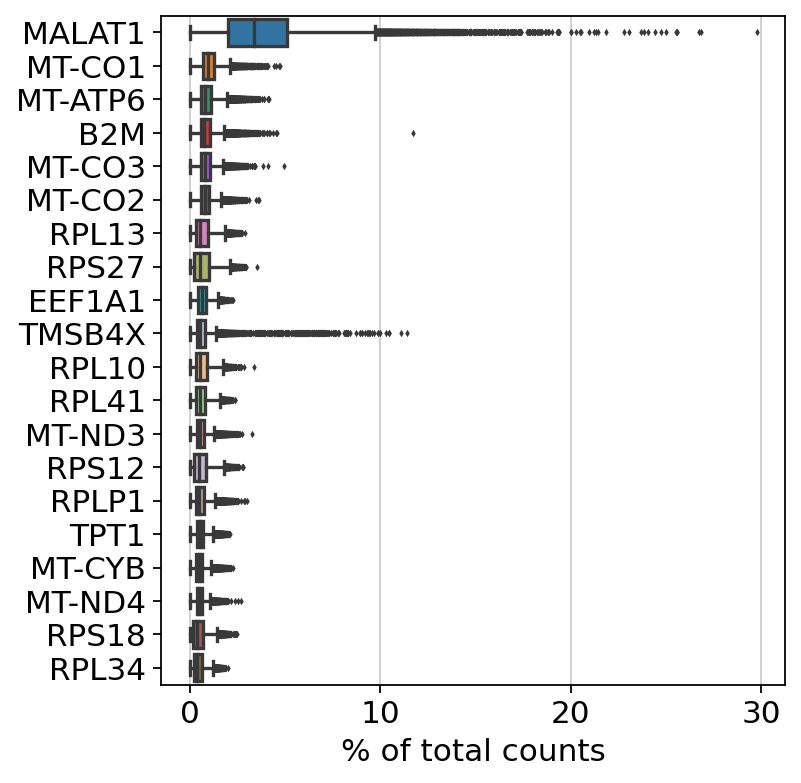

In [18]:
#top 20 Highest expressing genes 
print ("Highest expressed genes post QC cutoff chosen")

sc.pl.highest_expr_genes(adata, n_top=20)

In [19]:
# we need to redefine the mito_genes,hb_genes, since they were first 
# calculated on the full object before removing low expressed genes.
print ("Removing some unwanted genes named MALAT1")
malat1 = adata.var_names.str.startswith('MALAT1')

mito_genes = adata.var_names.str.startswith('MT-')
hb_genes = adata.var_names.str.contains('^HB[^(P)]')

remove = np.add(mito_genes, malat1)
remove = np.add(remove, hb_genes)
keep = np.invert(remove)

adata = adata[:,keep]

print(adata.n_obs, adata.n_vars)

Removing some unwanted genes named MALAT1
51429 29841


After removing some unwanted genes, current top 20 highest expressed genes


/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning:

Received a view of an AnnData. Making a copy.



normalizing counts per cell
    finished (0:00:01)


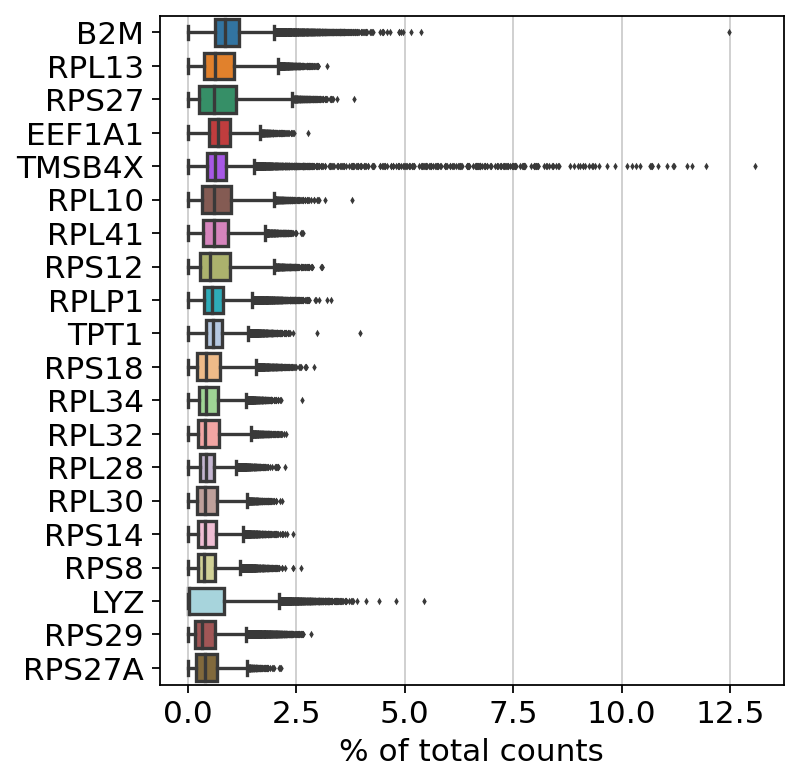

In [20]:
#top 20 Highest expressing genes 
print ("After removing some unwanted genes, current top 20 highest expressed genes")

sc.pl.highest_expr_genes(adata, n_top=20)

In [21]:
# chromosomeY: males and XIST (X-inactive specific transcript):female).To determine per sample which mixups. 
#chromosomeY adjustment step 1
annot = sc.queries.biomart_annotations(
        "hsapiens",
        ["ensembl_gene_id", "external_gene_name", "start_position", "end_position", "chromosome_name"],
    ).set_index("external_gene_name")

chrY_genes = adata.var_names.intersection(annot.index[annot.chromosome_name == "Y"])
chrY_genes


Index(['PLCXD1', 'GTPBP6', 'LINC00685', 'PPP2R3B', 'SHOX', 'CRLF2', 'CSF2RA',
       'IL3RA', 'SLC25A6', 'LINC00106', 'ASMTL-AS1', 'ASMTL', 'P2RY8',
       'AKAP17A', 'ASMT', 'DHRSX', 'DHRSX-IT1', 'ZBED1', 'LINC00102', 'CD99',
       'VAMP7', 'IL9R', 'WASIR1', 'RPS4Y1', 'ZFY', 'ZFY-AS1', 'LINC00278',
       'PCDH11Y', 'TBL1Y', 'PRKY', 'USP9Y', 'DDX3Y', 'UTY', 'TMSB4Y', 'NLGN4Y',
       'FAM224A', 'HSFY2', 'TTTY14', 'KDM5D', 'TTTY10', 'EIF1AY', 'RPS4Y2',
       'PRORY', 'TTTY4B'],
      dtype='object')

In [22]:
#chromosomeY adjustment step 2

adata.obs['percent_chrY'] = np.sum(
    adata[:, chrY_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1 * 100

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:490: MatplotlibDeprecationWarning:

The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.



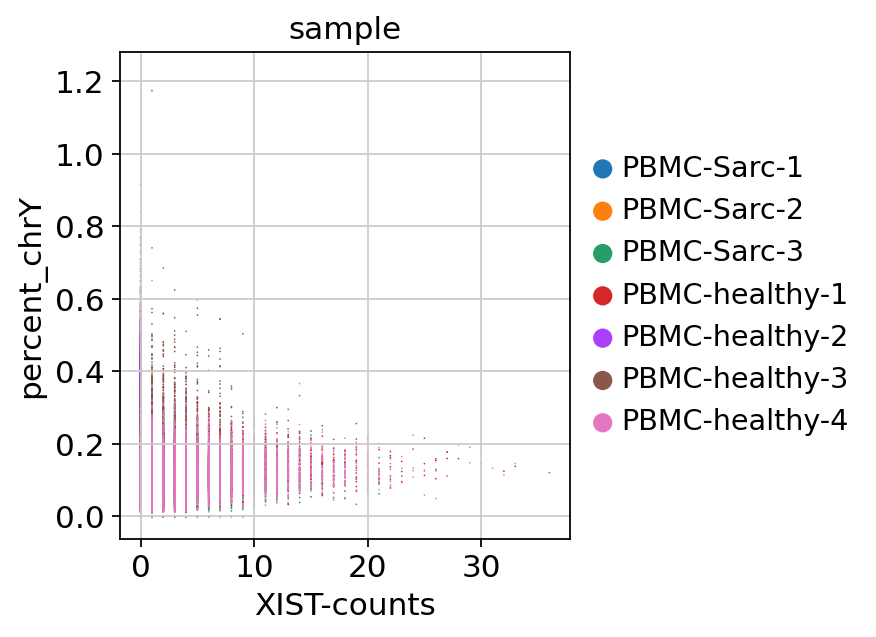

In [23]:
# color inputs must be from either .obs or .var, so add in XIST expression to obs.
#chromosomeY adjustment step 3

adata.obs["XIST-counts"] = adata.X[:,adata.var_names.str.match('XIST')].toarray()

sc.pl.scatter(adata, x='XIST-counts', y='percent_chrY', color="sample")

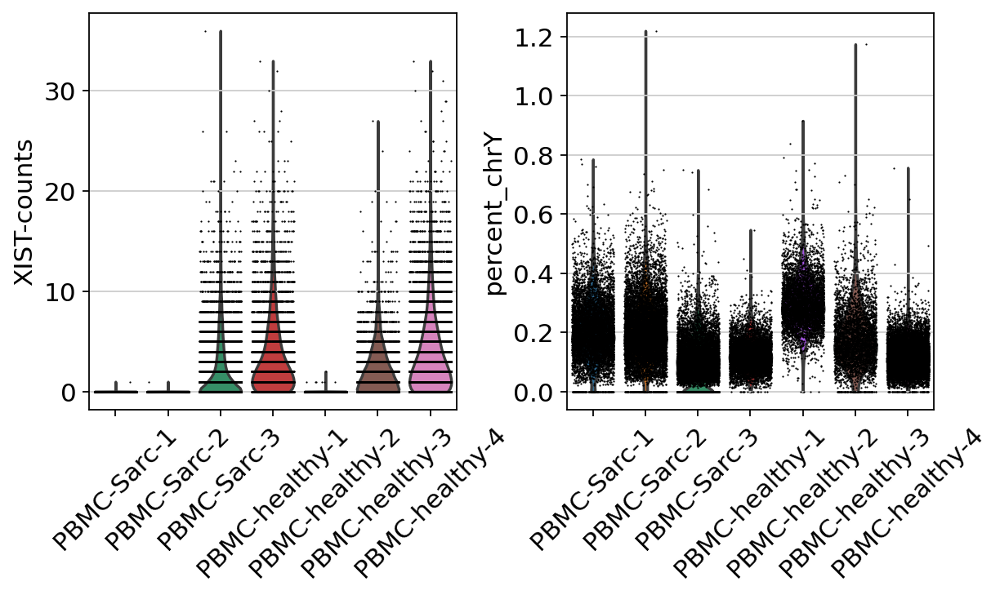

In [24]:
#chromosomeY adjustment step 4
#violin plot of XIST-counts, percent_chrY inside adata

sc.pl.violin(adata, ["XIST-counts", "percent_chrY"], jitter=0.4, groupby = 'sample', rotation= 45)

In [25]:
# adata raw is assigned with adata for post processing
adata.raw = adata
                

In [26]:
#Doublet detetection

print ("Doublet detection")
import scrublet as scr

# split per batch into new objects.
batches = adata.obs['sample'].cat.categories.tolist()
alldata = {}
for batch in batches:
    tmp = adata[adata.obs['sample'] == batch,]
    print(batch, ":", tmp.shape[0], " cells")
    scrub = scr.Scrublet(tmp.raw.X, expected_doublet_rate = 0.06)
    out = scrub.scrub_doublets(verbose=False, min_counts=2, min_cells=3,min_gene_variability_pctl=85,n_prin_comps=50)
    alldata[batch] = pd.DataFrame({'doublet_score':out[0],'predicted_doublets':out[1]},index = tmp.obs.index)
    print(alldata[batch].predicted_doublets.sum(), " predicted_doublets")
    print(round(alldata[batch].predicted_doublets.sum()/tmp.shape[0]*100,2), " predicted doublet Percentage\n")
    
    

Doublet detection
PBMC-Sarc-1 : 6894  cells
328  predicted_doublets
4.76  predicted doublet Percentage

PBMC-Sarc-2 : 9792  cells
654  predicted_doublets
6.68  predicted doublet Percentage

PBMC-Sarc-3 : 8355  cells
370  predicted_doublets
4.43  predicted doublet Percentage

PBMC-healthy-1 : 5943  cells
163  predicted_doublets
2.74  predicted doublet Percentage

PBMC-healthy-2 : 4887  cells
110  predicted_doublets
2.25  predicted doublet Percentage

PBMC-healthy-3 : 3736  cells
126  predicted_doublets
3.37  predicted doublet Percentage

PBMC-healthy-4 : 11822  cells
530  predicted_doublets
4.48  predicted doublet Percentage



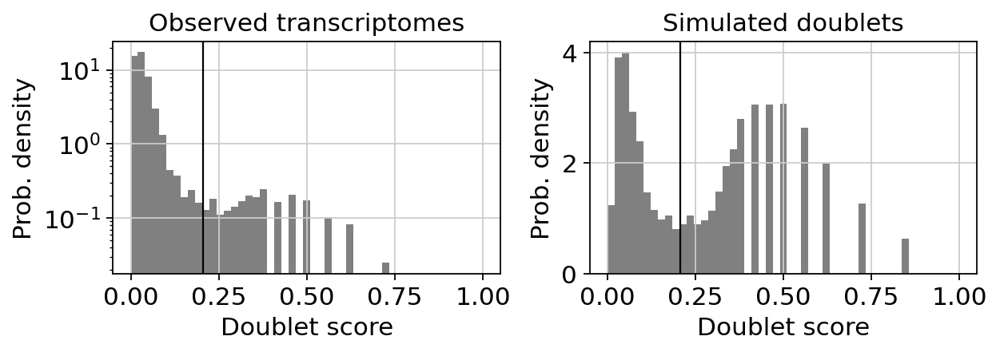

In [27]:
#Histogram plot doublet detection 

scrub.plot_histogram();


In [28]:
# Doublet detector predictions adding to the adata object.

scrub_pred = pd.concat(alldata.values())
adata.obs['doublet_scores'] = scrub_pred['doublet_score'] 
adata.obs['predicted_doublets'] = scrub_pred['predicted_doublets'] 

sum(adata.obs['predicted_doublets'])



2281

... storing 'doublet_info' as categorical


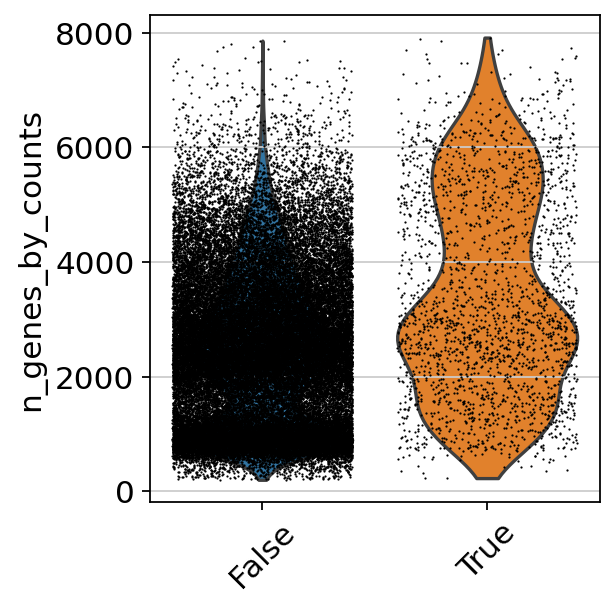

In [29]:
# add in column with singlet/doublet instead of True/Fals
%matplotlib inline

adata.obs['doublet_info'] = adata.obs["predicted_doublets"].astype(str)

sc.pl.violin(adata, 'n_genes_by_counts',
             jitter=0.4, groupby = 'doublet_info', rotation=45)


Standard pipeline SC RNA seq
normalizing counts per cell
    finished (0:00:01)
extracting highly variable genes
    finished (0:00:06)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


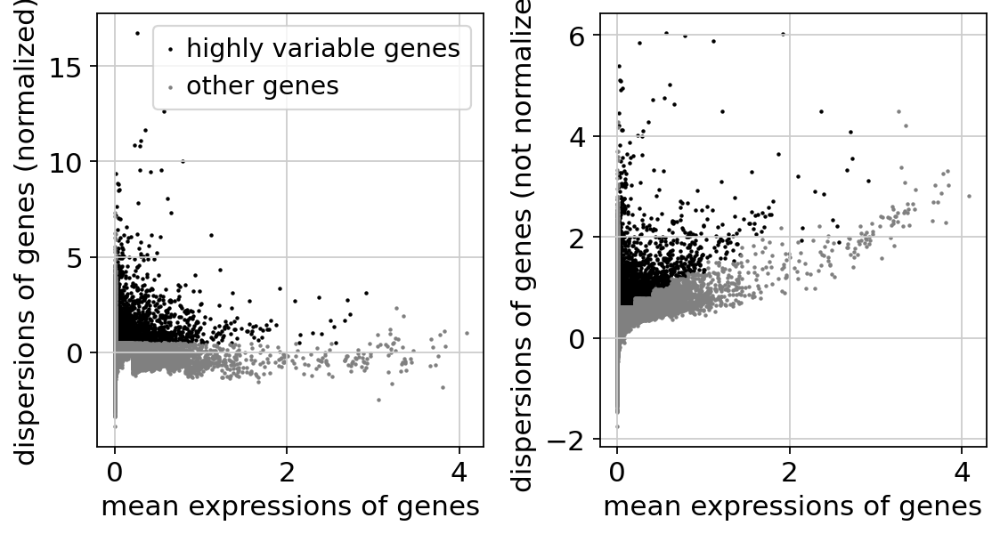

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:04:51)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:14)


/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



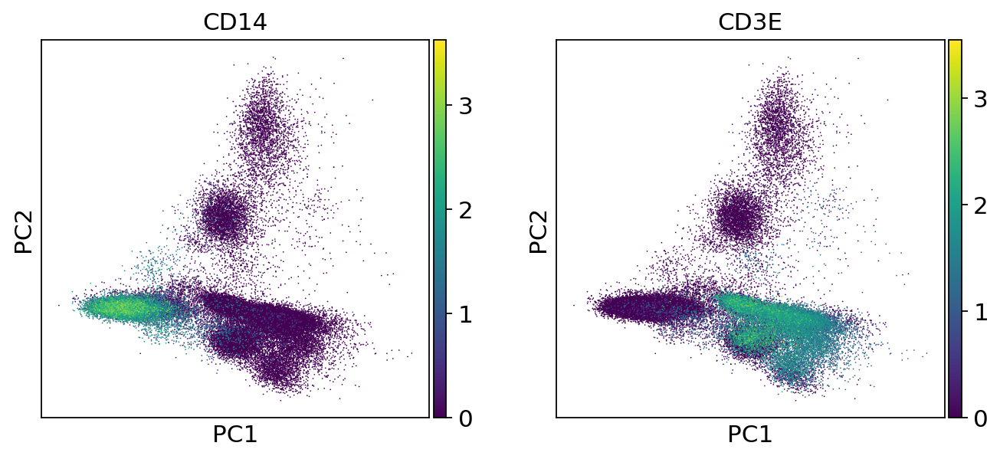

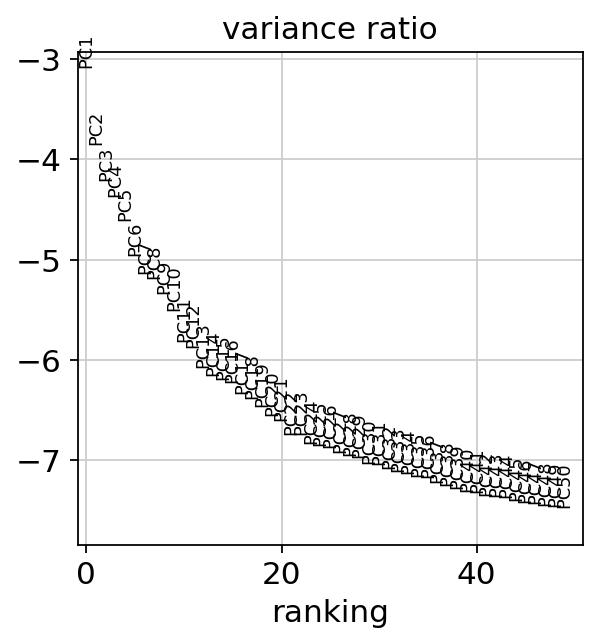

In [30]:
#sandard Pipeline used here

print ("Standard pipeline SC RNA seq")

#Normalize the data
sc.pp.normalize_total(adata)

#Logarithmize the data
sc.pp.log1p(adata)

#Identify highly-variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

#displaying Highly variable genes before normalize and after normalization
sc.pl.highly_variable_genes(adata)

#Getting back to an AnnData of the object in .raw by calling .raw.to_adata().
adata.raw = adata

#filtering highly variable genes 
adata = adata[:, adata.var.highly_variable]


#Regressing out effects of total counts per cell and the percentage of mitochondrial genes expressed
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

#Scale the data to unit variance and Clip values exceeding standard deviation 10
sc.pp.scale(adata, max_value=10)

#Reduce the dimensionality of the data by running principal component analysis (PCA). Denoising the data
sc.tl.pca(adata, svd_solver='arpack')

#scatter plot generation in the PCA coordinates, with CD14 and CD3E
sc.pl.pca(adata, color= ['CD14', 'CD3E'])

#PCA total variance data

from numba import njit
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)


In [31]:
#Cell cycle score computing step1

cell_cycle_genes = [x.strip() for x in open('./data/regev_lab_cell_cycle_genes.txt')]
print(len(cell_cycle_genes))

# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
print(len(cell_cycle_genes))

97
22


/tmp/ipykernel_1944631/3397686964.py:3: ResourceWarning:

unclosed file <_io.TextIOWrapper name='./data/regev_lab_cell_cycle_genes.txt' mode='r' encoding='UTF-8'>



In [32]:
#Cell cycle score computing step2

sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    643 total control genes are used. (0:00:03)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    688 total control genes are used. (0:00:03)
-->     'phase', cell cycle phase (adata.obs)


computing PCA
    on highly variable genes
    with n_comps=21
    finished (0:00:01)


... storing 'phase' as categorical
/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



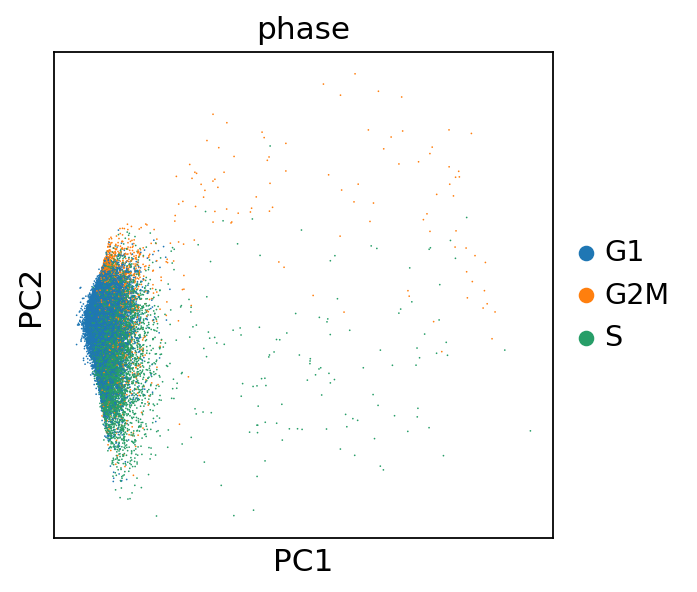

... storing 'phase' as categorical


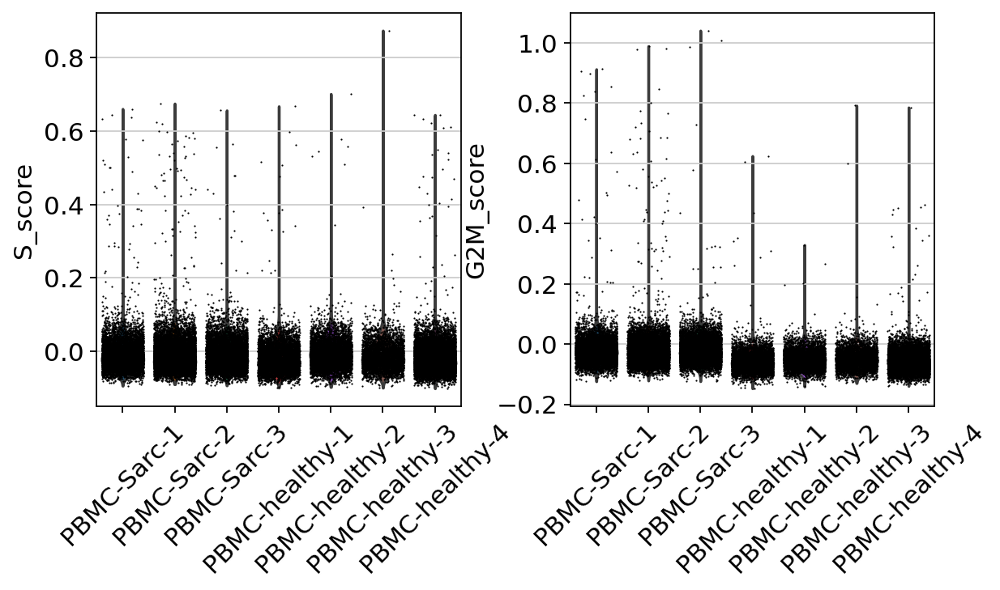

In [33]:
#Cell cycle score computing step3
adata_cc_genes = adata[:, cell_cycle_genes]
sc.tl.pca(adata_cc_genes, svd_solver='arpack')
sc.pl.pca_scatter(adata_cc_genes, color='phase')
sc.pl.violin(adata, ['S_score', 'G2M_score'],
             jitter=0.4, groupby = 'sample', rotation=45)

In [34]:
#Cell cycle score computing step4
#regressing out cell S_score and G2M_score
sc.pp.regress_out(adata, ['S_score', 'G2M_score'])
sc.pp.scale(adata)


regressing out ['S_score', 'G2M_score']
    finished (0:03:23)


computing PCA
    on highly variable genes
    with n_comps=21
    finished (0:00:01)


/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



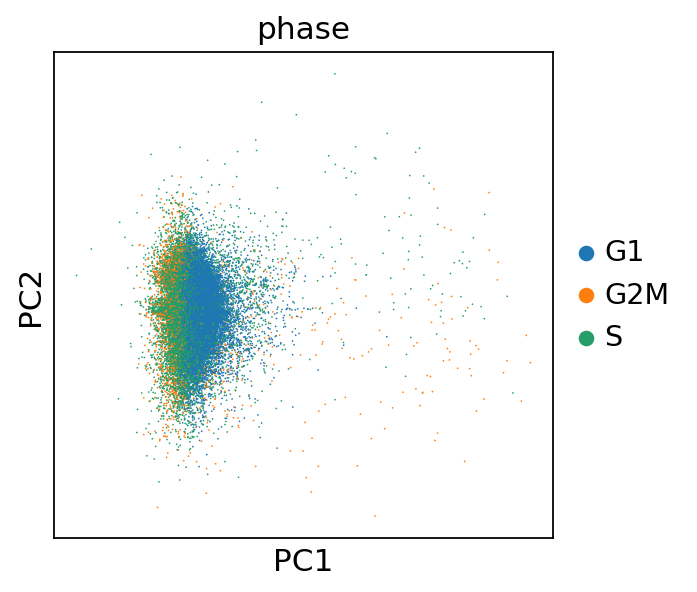

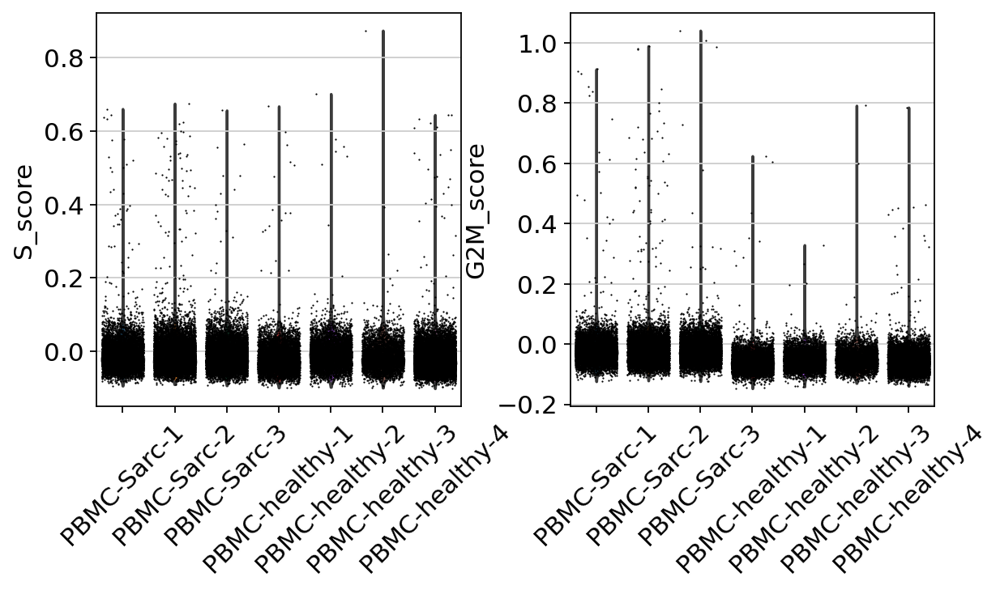

In [35]:
#Cell cycle score computing step5
#after regressing out cell S_score and G2M_score, checked inside adata

adata_cc_genes = adata[:, cell_cycle_genes]
sc.tl.pca(adata_cc_genes)
sc.pl.pca_scatter(adata_cc_genes, color='phase')
sc.pl.violin(adata, ['S_score', 'G2M_score'],
             jitter=0.4, groupby = 'sample', rotation=45)

Computing Different PCA values
computing neighbors
    using 'X_pca' with n_pcs = 5


/home/jana/my-notebook-venv/lib/python3.8/site-packages/numba/core/typed_passes.py:334: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.readthedocs.io/en/stable/user/parallel.html#diagnostics for help.

File "my-notebook-venv/lib/python3.8/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^


/home/jana/my-notebook-venv/lib/python3.8/site-packages/umap/nndescent.py:91: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.readthedocs.io/en/stable/user/parallel.html#diagnostics for help.

File "my-notebook-venv/lib/python3.8/site-packages/umap/utils.py", line 409:
@

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:17)
running Leiden clustering
    finished: found 34 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:03)


/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



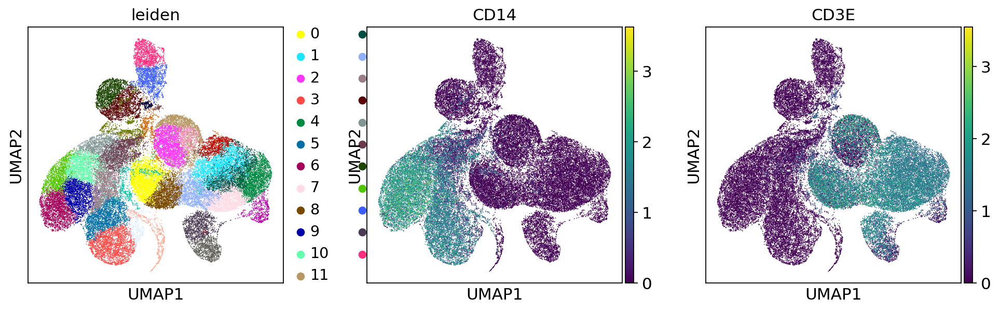

computing neighbors
    using 'X_pca' with n_pcs = 10


/home/jana/my-notebook-venv/lib/python3.8/site-packages/numba/core/typed_passes.py:334: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.readthedocs.io/en/stable/user/parallel.html#diagnostics for help.

File "my-notebook-venv/lib/python3.8/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^




    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)
running Leiden clustering
    finished: found 34 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:02)


/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



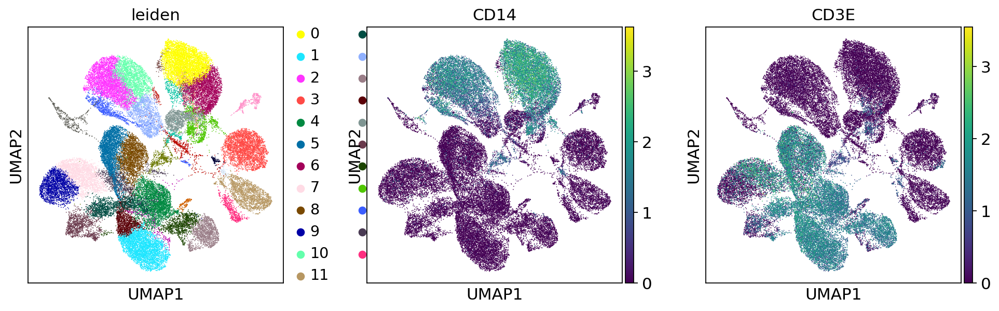

computing neighbors
    using 'X_pca' with n_pcs = 15


/home/jana/my-notebook-venv/lib/python3.8/site-packages/numba/core/typed_passes.py:334: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.readthedocs.io/en/stable/user/parallel.html#diagnostics for help.

File "my-notebook-venv/lib/python3.8/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^




    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)
running Leiden clustering
    finished: found 36 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:09)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:11)


/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



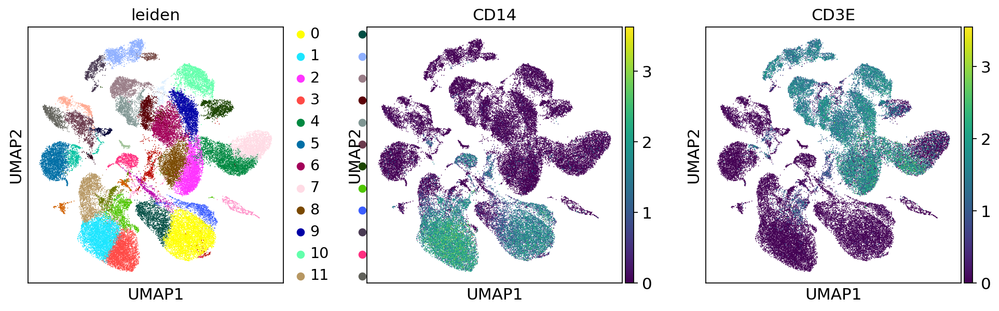

computing neighbors
    using 'X_pca' with n_pcs = 20


/home/jana/my-notebook-venv/lib/python3.8/site-packages/numba/core/typed_passes.py:334: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.readthedocs.io/en/stable/user/parallel.html#diagnostics for help.

File "my-notebook-venv/lib/python3.8/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^




    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:12)
running Leiden clustering
    finished: found 42 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:15)


/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



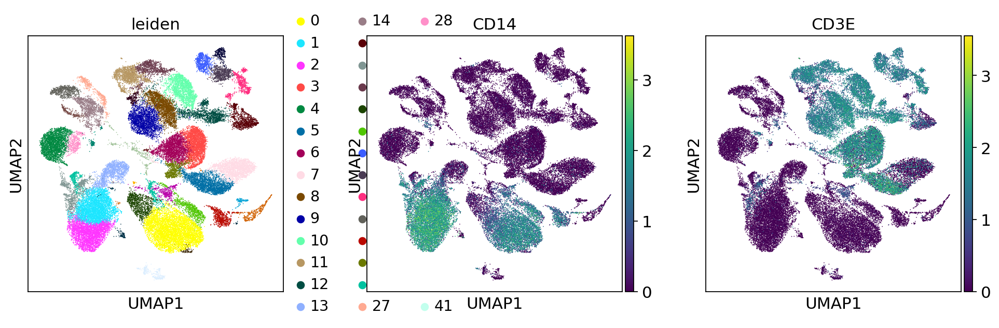

computing neighbors
    using 'X_pca' with n_pcs = 25


/home/jana/my-notebook-venv/lib/python3.8/site-packages/numba/core/typed_passes.py:334: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.readthedocs.io/en/stable/user/parallel.html#diagnostics for help.

File "my-notebook-venv/lib/python3.8/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^




    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:13)
running Leiden clustering
    finished: found 41 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:08)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:16)


/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



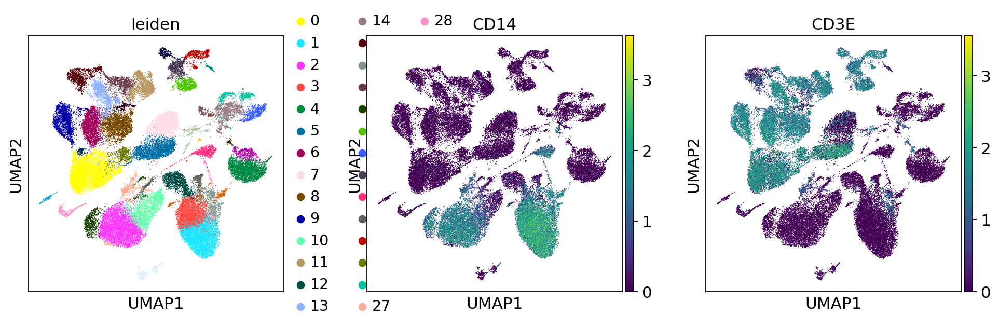

computing neighbors
    using 'X_pca' with n_pcs = 30


/home/jana/my-notebook-venv/lib/python3.8/site-packages/numba/core/typed_passes.py:334: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.readthedocs.io/en/stable/user/parallel.html#diagnostics for help.

File "my-notebook-venv/lib/python3.8/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^




    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:13)
running Leiden clustering
    finished: found 41 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:12)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:13)


/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



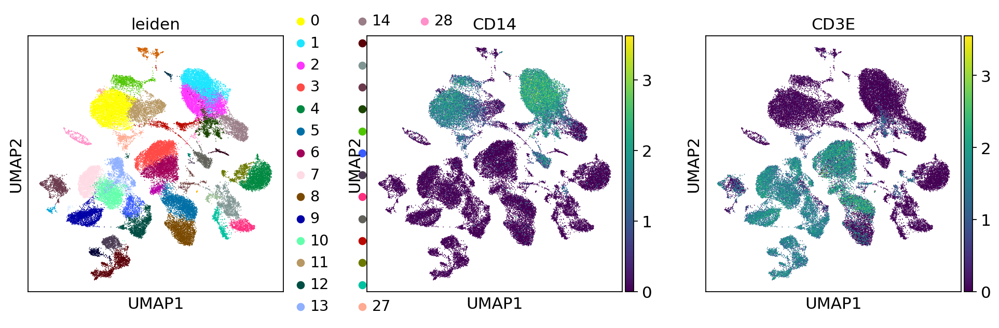

computing neighbors
    using 'X_pca' with n_pcs = 50


/home/jana/my-notebook-venv/lib/python3.8/site-packages/numba/core/typed_passes.py:334: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.readthedocs.io/en/stable/user/parallel.html#diagnostics for help.

File "my-notebook-venv/lib/python3.8/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^


/home/jana/my-notebook-venv/lib/python3.8/site-packages/numba/core/typed_passes.py:334: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.readthedocs.io/en/stable/user/parallel.html#diagnostics for help.

File "my-notebook-venv/lib/python3.8/site-packages/umap/nndescent.py

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:15)
running Leiden clustering
    finished: found 42 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:09)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:10)


/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



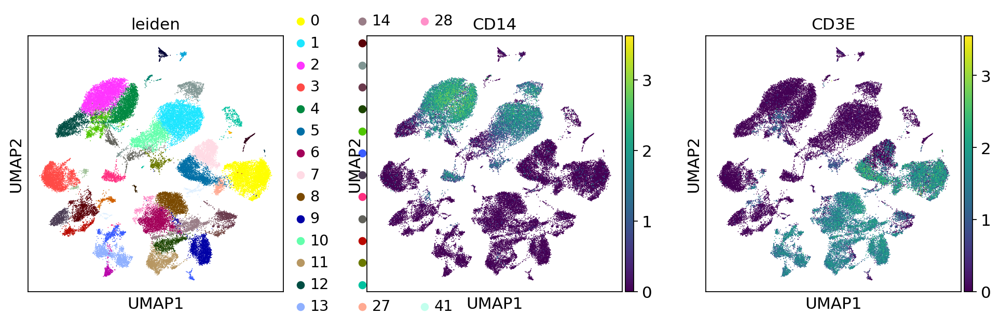

In [36]:
# Computing the neighborhood graph
# Neighborhood graph of cells using the PCA representation of the data matrix computation.

# Copy adata not to modify UMAP in the original adata object
adata_temp=adata.copy()

print("Computing Different PCA values")

# Define the PCA values
pcas = [5, 10, 15, 20, 25, 30, 50]

# Loop through different PCA values
for pcs in pcas:
    # Compute neighborhood graph
    sc.pp.neighbors(adata_temp, n_neighbors=10, n_pcs=pcs)

    # Cluster the neighborhood graph using Leiden Clustering algorithm
    sc.tl.leiden(adata_temp)
    
    # Perform UMAP embedding
    sc.tl.umap(adata_temp)

    # Plot UMAP with clusters using Leiden algorithm 
    sc.pl.umap(adata_temp, color=['leiden', 'CD14', 'CD3E'])


#delete temporary adata_temp
del adata_temp

Text(0, 0.5, 'UMAPClusters')

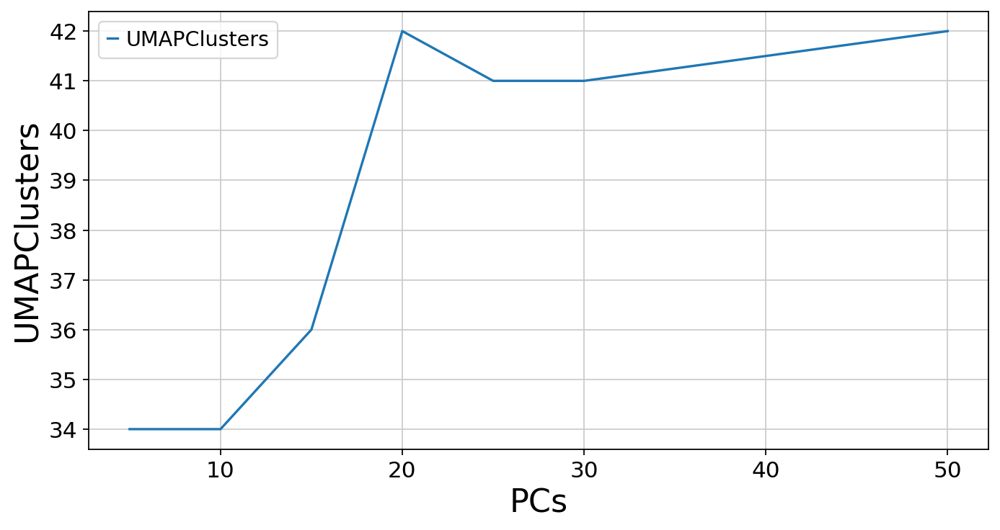

In [37]:
#Plot PCs vs UMAPClusters

df = pd.DataFrame(data={'PCs': [5, 10, 15, 20, 25, 30, 50], 
                        'UMAPClusters': [34, 34, 36, 42, 41, 41, 42]})

fig, ax = plt.subplots(figsize=(10,5)) 

df.plot(x = 'PCs', y = 'UMAPClusters', ax = ax) 

plt.xlabel('PCs', fontsize=20)
plt.ylabel('UMAPClusters', fontsize=20)

computing neighbors
    using 'X_pca' with n_pcs = 20


/home/jana/my-notebook-venv/lib/python3.8/site-packages/numba/core/typed_passes.py:334: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.readthedocs.io/en/stable/user/parallel.html#diagnostics for help.

File "my-notebook-venv/lib/python3.8/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^


/home/jana/my-notebook-venv/lib/python3.8/site-packages/numba/core/typed_passes.py:334: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.readthedocs.io/en/stable/user/parallel.html#diagnostics for help.

File "my-notebook-venv/lib/python3.8/site-packages/umap/nndescent.py

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:13)
running Leiden clustering
    finished: found 42 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:03)


/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



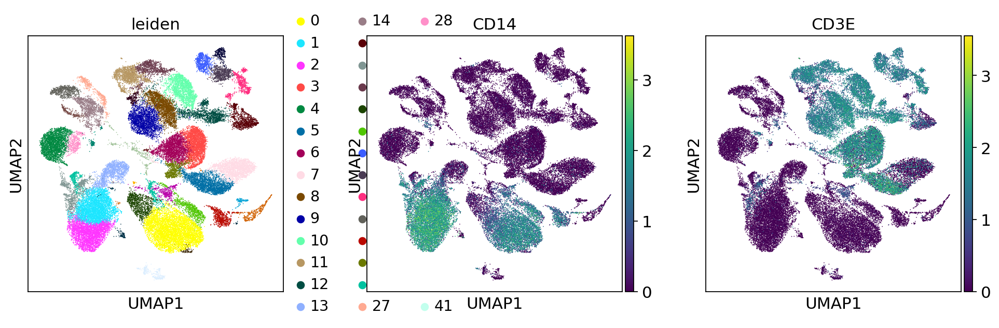

In [38]:
 
#After confirming n_pcs=20 optimal clusters, I am continuing the value to the rest of the analysis
    
# Compute neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)

# Cluster the neighborhood graph using Leiden Clustering algorithm
sc.tl.leiden(adata)
    
# Perform UMAP embedding
sc.tl.umap(adata)

# Plot UMAP with clusters using Leiden algorithm 
sc.pl.umap(adata, color=['leiden', 'CD14', 'CD3E'])


Doublet finding plots with scores and info across the samples


/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



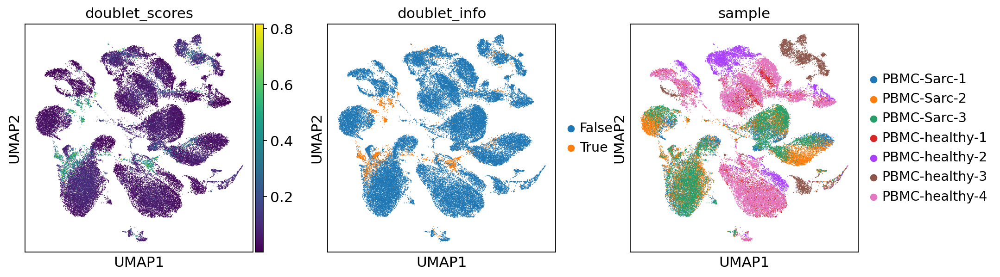

In [39]:
#Displaying Doublet scores, Doublet info and Sample wise distrubtion 
print ("Doublet finding plots with scores and info across the samples")

sc.pl.umap(adata, color=['doublet_scores','doublet_info','sample'])

In [40]:
#Doublet removing and Rest samples for post processing
print ("Considering the False Doublet finding information, means we are considering non doublet portion for the rest of tha analysis")
# also revert back to the raw counts as the main matrix in adata
adata = adata.raw.to_adata() 

adata = adata[adata.obs['doublet_info'] == 'False',:]

print ("Current shape of the data")
print(adata.shape)

Considering the False Doublet finding information, means we are considering non doublet portion for the rest of tha analysis
Current shape of the data
(49148, 29841)


/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



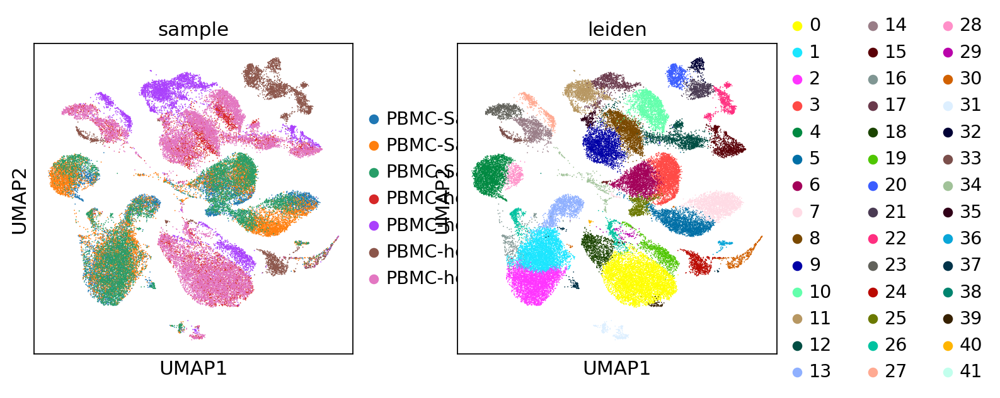

In [41]:
#umap of the current data after the doublet removal

sc.pl.umap(adata, color=['sample','leiden'])

In [42]:
#BatchCorrection is done using Harmony algorithm

print ("Batch correction using Harmony algorithm")
sce.pp.harmony_integrate(adata, 'sample')

2024-01-08 20:35:26,856 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...


Batch correction using Harmony algorithm


2024-01-08 20:35:56,182 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2024-01-08 20:35:56,862 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2024-01-08 20:36:45,395 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2024-01-08 20:37:32,945 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2024-01-08 20:38:19,539 - harmonypy - INFO - Iteration 4 of 10
INFO:harmonypy:Iteration 4 of 10
2024-01-08 20:39:07,373 - harmonypy - INFO - Iteration 5 of 10
INFO:harmonypy:Iteration 5 of 10
2024-01-08 20:39:55,682 - harmonypy - INFO - Converged after 5 iterations
INFO:harmonypy:Converged after 5 iterations


In [43]:
#Post proccssing of Harmonization
print ("Post proccssing of Harmonization")
#current PCA is aligned to Harmonized PCA values 
adata.obsm['X_pca'] = adata.obsm['X_pca_harmony']

#Computing neighborhood graphs and Clustering
print ("Computing neighborhood graphs and Clustering")
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)

#Clustering the neighborhood graph using Leiden Clustering algorithm
sc.tl.leiden(adata)
sc.tl.umap(adata)


Post proccssing of Harmonization
Computing neighborhood graphs and Clustering
computing neighbors
    using 'X_pca' with n_pcs = 20


/home/jana/my-notebook-venv/lib/python3.8/site-packages/numba/core/typed_passes.py:334: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.readthedocs.io/en/stable/user/parallel.html#diagnostics for help.

File "my-notebook-venv/lib/python3.8/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^




    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:15)
running Leiden clustering
    finished: found 25 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:13)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:04)


/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/jana/my-notebook-venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



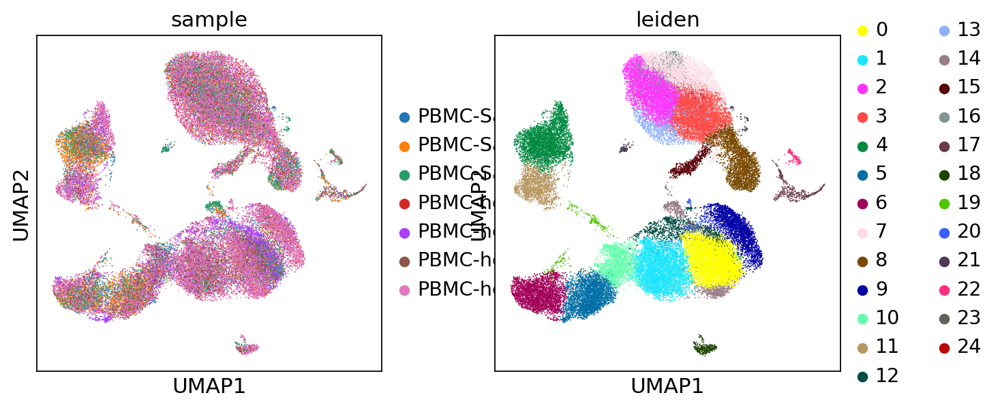

In [44]:
#UMAP cluster view Sample wise and cluster wise
sc.pl.umap(adata, color=['sample', 'leiden'])

In [45]:
#display merged object
display(adata)

AnnData object with n_obs × n_vars = 49148 × 29841
    obs: 'type', 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'percent_chrY', 'XIST-counts', 'doublet_scores', 'predicted_doublets', 'doublet_info', 'S_score', 'G2M_score', 'phase', 'leiden'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'sample_colors', 'doublet_info_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors'
    obsm: 'X_pca', 'X_umap', 'X_pca_harmony'
    obsp: 'distances', 'connectivities'

In [46]:
# Print merged adata var (variable) types
display(adata.var, adata.obs)






,gene_ids,feature_types,mt,ribo,hb,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
AL627309.1,ENSG00000238009,Gene Expression,False,False,False,285,0.005500,99.466841,294.0,285,False,0.004027,0.444233,0.193792
AL627309.3,ENSG00000239945,Gene Expression,False,False,False,12,0.000224,99.977551,12.0,12,False,0.000164,-0.074608,-0.769612
AL627309.5,ENSG00000241860,Gene Expression,False,False,False,1824,0.036236,96.587784,1937.0,1824,True,0.030062,0.674825,0.621962
AL627309.4,ENSG00000241599,Gene Expression,False,False,False,20,0.000393,99.962585,21.0,20,False,0.000256,-0.121534,-0.856745
AL669831.2,ENSG00000229905,Gene Expression,False,False,False,14,0.000262,99.973810,14.0,14,False,0.000292,1.264503,1.716899
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC240274.1,ENSG00000271254,Gene Expression,False,False,False,1116,0.022767,97.912263,1217.0,1116,False,0.015271,0.236590,-0.191767
AC004556.3,ENSG00000276345,Gene Expression,False,False,False,2310,0.047236,95.678608,2525.0,2310,False,0.029213,0.014654,-0.603865
AC233755.2,ENSG00000277856,Gene Expression,False,False,False,23,0.000449,99.956973,24.0,23,False,0.000989,1.065666,1.347692
AC233755.1,ENSG00000275063,Gene Expression,False,False,False,15,0.000299,99.971939,16.0,15,False,0.000602,1.193798,1.585611


,type,sample,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,...,n_genes,percent_chrY,XIST-counts,doublet_scores,predicted_doublets,doublet_info,S_score,G2M_score,phase,leiden
AAACCCAAGACATAAC-1-0,Sarcoidosis,PBMC-Sarc-1,0,385,585.0,27.0,4.615385,32.0,5.470086,1.0,...,385,0.395257,0.0,0.041903,False,False,-0.039626,-0.012183,G1,21
AAACCCAAGAGGCGGA-1-0,Sarcoidosis,PBMC-Sarc-1,0,2191,5556.0,423.0,7.613391,613.0,11.033117,2.0,...,2191,0.141357,0.0,0.055593,False,False,0.016786,-0.035341,S,13
AAACCCAAGCGTACAG-1-0,Sarcoidosis,PBMC-Sarc-1,0,936,2864.0,253.0,8.833798,1131.0,39.490223,0.0,...,936,0.122549,0.0,0.025763,False,False,-0.040631,-0.044359,G1,4
AAACCCAAGGTACAAT-1-0,Sarcoidosis,PBMC-Sarc-1,0,3622,11581.0,736.0,6.355237,1679.0,14.497885,2.0,...,3622,0.192419,0.0,0.075410,False,False,0.026428,-0.025013,S,7
AAACCCACAGCGTACC-1-0,Sarcoidosis,PBMC-Sarc-1,0,2219,6849.0,536.0,7.825960,1114.0,16.265148,0.0,...,2219,0.184967,0.0,0.017589,False,False,-0.051409,-0.048706,G1,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTCGCAACC-1-6,Healthy,PBMC-healthy-4,6,3587,10727.0,377.0,3.514496,864.0,8.054442,0.0,...,3587,0.097886,3.0,0.053745,False,False,-0.014463,-0.064767,G1,2
TTTGTTGGTTGGATCT-1-6,Healthy,PBMC-healthy-4,6,2795,9286.0,391.0,4.210640,2746.0,29.571400,0.0,...,2795,0.166905,2.0,0.021569,False,False,-0.054633,-0.035245,G1,9
TTTGTTGGTTTCTTAC-1-6,Healthy,PBMC-healthy-4,6,2891,6943.0,211.0,3.039032,952.0,13.711652,1.0,...,2891,0.123839,1.0,0.006250,False,False,-0.037439,-0.053038,G1,5
TTTGTTGTCCATTTCA-1-6,Healthy,PBMC-healthy-4,6,2539,7021.0,376.0,5.355362,1831.0,26.078907,0.0,...,2539,0.190144,2.0,0.038262,False,False,0.018820,-0.047190,S,1


In [47]:
#import scipy io package
from scipy import io

save_file = '/home/jana/scanpy_QC_filtered_PBMC_for_sarcoid.h5ad'
adata.write_h5ad(save_file)
